<a href="https://colab.research.google.com/github/mayanksisodia123/-6Companies30days/blob/main/Deepfake_Detection_Project_sem_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Problem -
Deepfake technology is a technology derived from the image synthesis technology in artificial intelligence. It achieves the purpose of forging identities through face replacement, and then integrates the technology of Generative Adversarial Network (GAN) to generate faces and then replace them.
Purpose-
Train a model to identify whether an object in an image is the result of a Deepfake (REAL/FAKE)

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mayanksisodia","key":"8ec30f40236adb05b381ac2e413c6b7a"}'}

In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets list

ref                                                    title                                            size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------  ----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
thedrcat/daigt-v2-train-dataset                        DAIGT V2 Train Dataset                           29MB  2023-11-16 01:38:36           1052        114  1.0              
muhammadbinimran/housing-price-prediction-data         Housing Price Prediction Data                   763KB  2023-11-21 17:56:32           3827         77  1.0              
carlmcbrideellis/llm-7-prompt-training-dataset         LLM: 7 prompt training dataset                   41MB  2023-11-15 07:32:56           1391        107  1.0              
maso0dahmed/video-games-data                           Video Games Data                                  5MB  2023-11-25 19:0

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge

100% 4.13G/4.13G [00:49<00:00, 146MB/s]
100% 4.13G/4.13G [00:49<00:00, 90.4MB/s]


In [ ]:
!unzip deepfake-detection-challenge.zip

Archive:  deepfake-detection-challenge.zip
  inflating: sample_submission.csv   
  inflating: test_videos/aassnaulhq.mp4  
  inflating: test_videos/aayfryxljh.mp4  
  inflating: test_videos/acazlolrpz.mp4  
  inflating: test_videos/adohdulfwb.mp4  
  inflating: test_videos/ahjnxtiamx.mp4  
  inflating: test_videos/ajiyrjfyzp.mp4  
  inflating: test_videos/aktnlyqpah.mp4  
  inflating: test_videos/alrtntfxtd.mp4  
  inflating: test_videos/aomqqjipcp.mp4  
  inflating: test_videos/apedduehoy.mp4  
  inflating: test_videos/apvzjkvnwn.mp4  
  inflating: test_videos/aqrsylrzgi.mp4  
  inflating: test_videos/axfhbpkdlc.mp4  
  inflating: test_videos/ayipraspbn.mp4  
  inflating: test_videos/bcbqxhziqz.mp4  
  inflating: test_videos/bcvheslzrq.mp4  
  inflating: test_videos/bdshuoldwx.mp4  
  inflating: test_videos/bfdopzvxbi.mp4  
  inflating: test_videos/bfjsthfhbd.mp4  
  inflating: test_videos/bjyaxvggle.mp4  
  inflating: test_videos/bkcyglmfci.mp4  
  inflating: test_videos/bktkwbcawi.m

In [ ]:
  !pip install -U --upgrade tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 50.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 56.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: keras
    Found existing installation: keras 2.14.0
    Uninstalling keras-2.14.0:
      Successfully uninstalled keras-2.14.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.14.1
    Uninstalling tensorboard-2.14.1:
      Successfully uninstalled tensorboard-2.14.1
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.14.0
    Uninstalling tensorflow-2.14.0:
      Successfully

In [ ]:
#Import related packages
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [ ]:
#Import data/View data size
DATA_FOLDER = '/content/sample_data'
TRAIN_SAMPLE_FOLDER = '/content/train_sample_videos'
TEST_FOLDER = '/content/test_videos'

print(f"train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

train samples: 401
test samples: 400


In [ ]:
train_sample_metadata = pd.read_json('/content/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


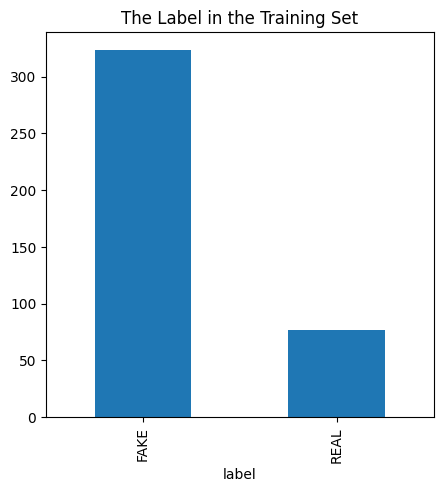

In [ ]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(5,5),kind='bar',title='The Label in the Training Set')
plt.show()

In [ ]:
#Check file dimensions
train_sample_metadata.shape

(400, 3)

capture images

Capture the image into image processing (divided into two parts: FAKE/REAL)

In [ ]:
 f_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(5).index)
f_train_sample_video

['eivxffliio.mp4',
 'avtycwsgyb.mp4',
 'ensyyivobf.mp4',
 'byijojkdba.mp4',
 'dsdoseflas.mp4']

In [ ]:
 def capture_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize =(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

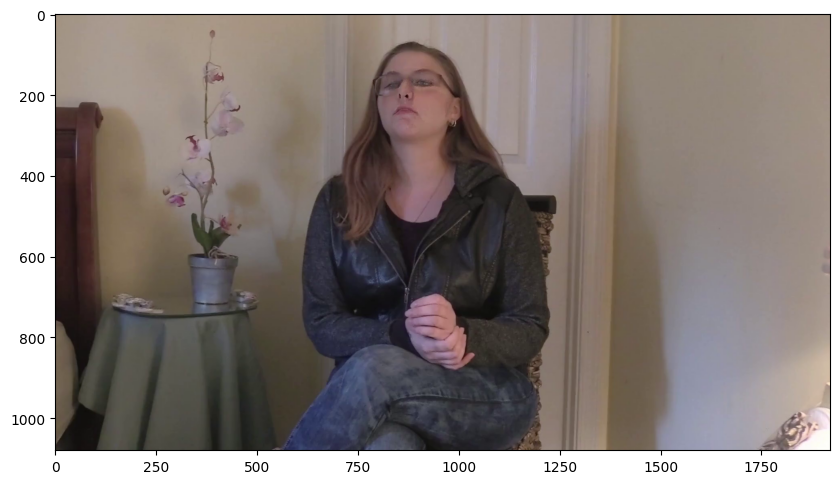

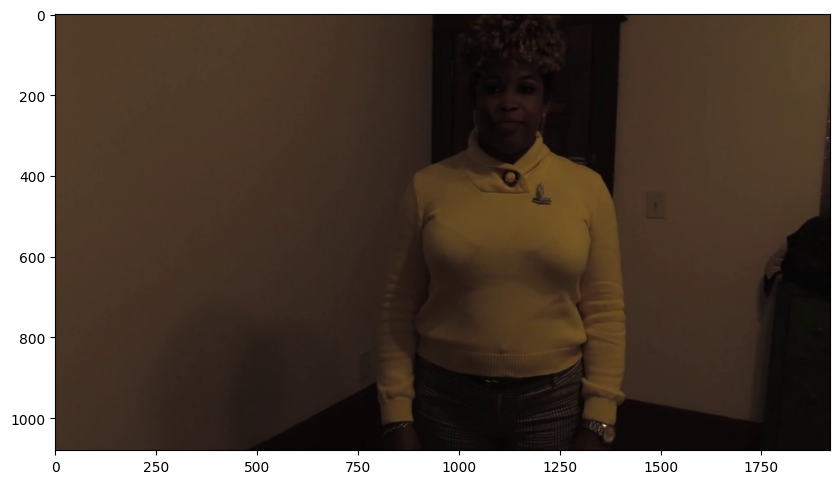

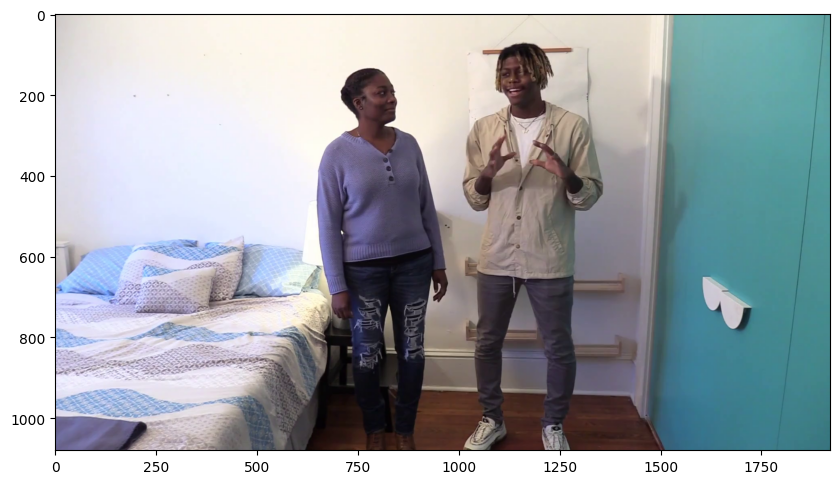

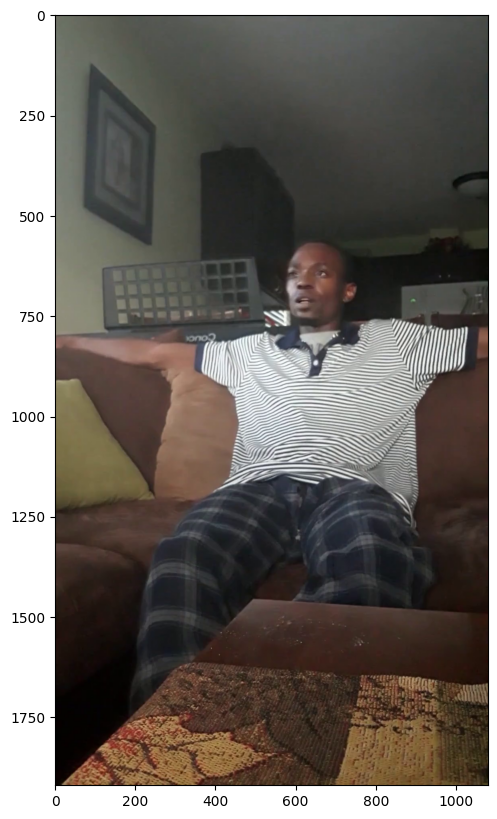

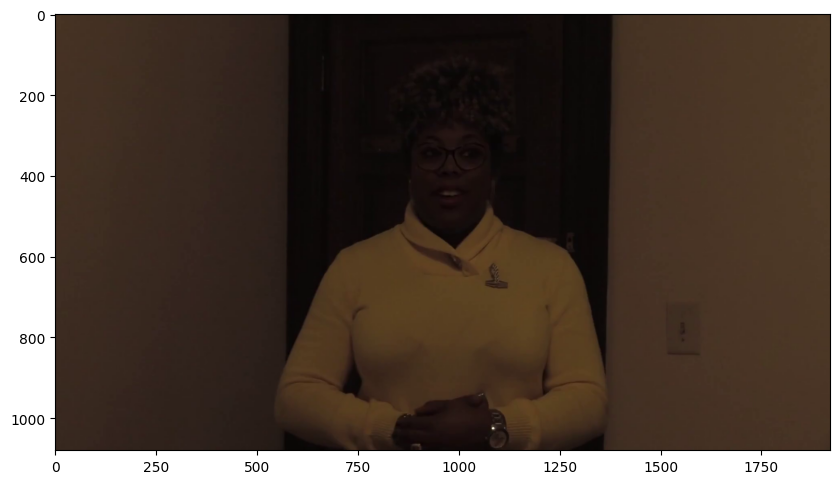

In [ ]:
for video_file in f_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [ ]:
r_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(5).index)
r_train_sample_video

['djxdyjopjd.mp4',
 'cppdvdejkc.mp4',
 'bffwsjxghk.mp4',
 'edyncaijwx.mp4',
 'ellavthztb.mp4']

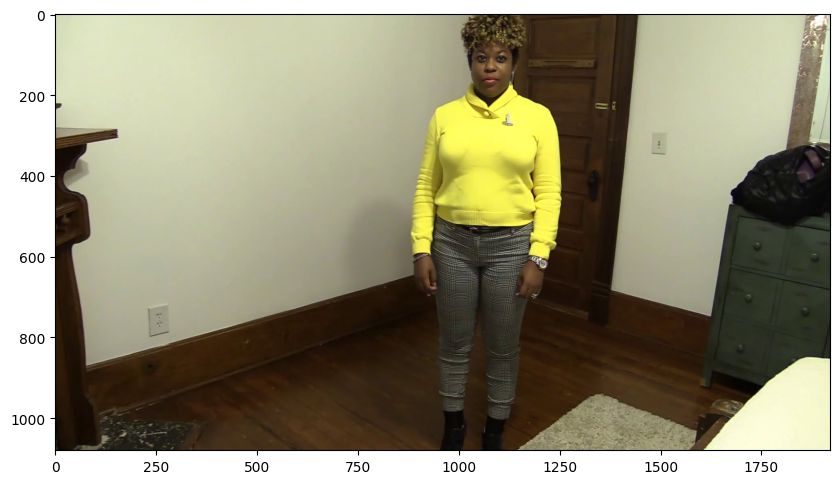

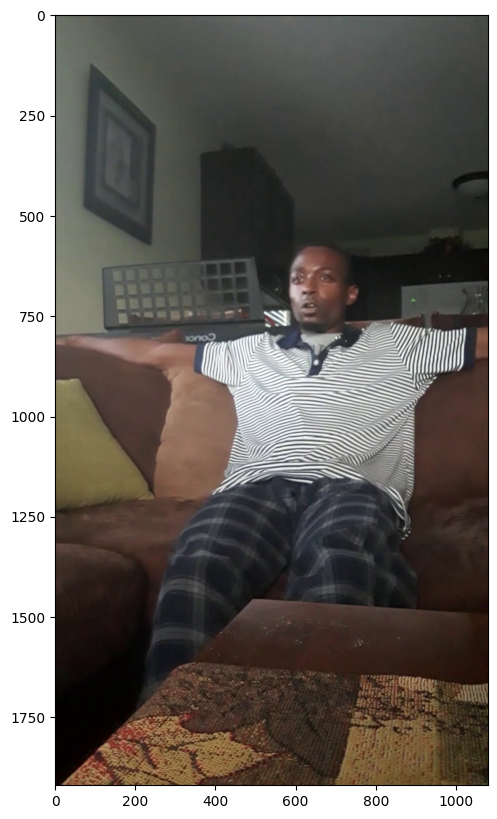

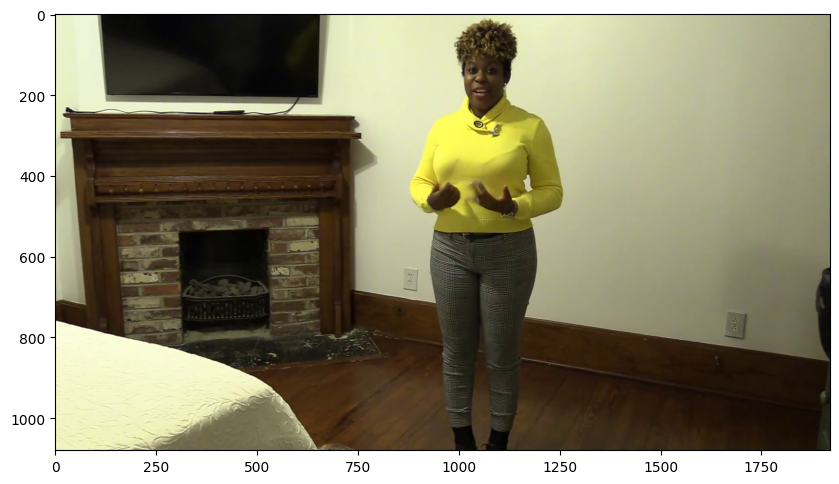

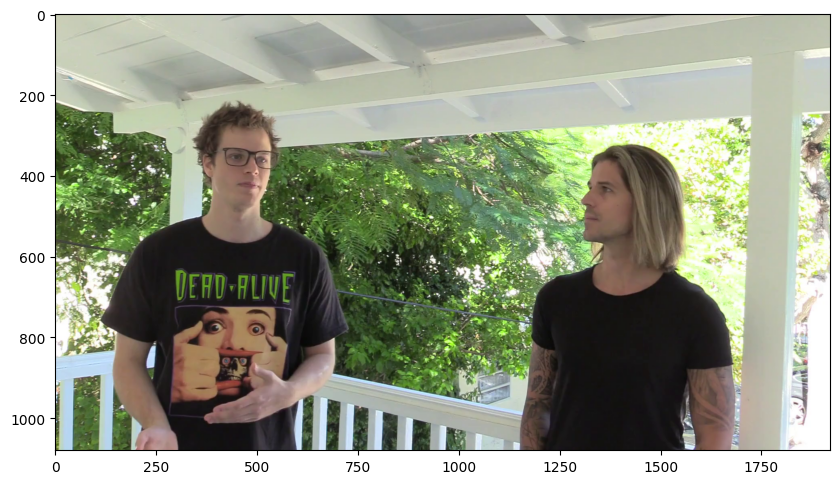

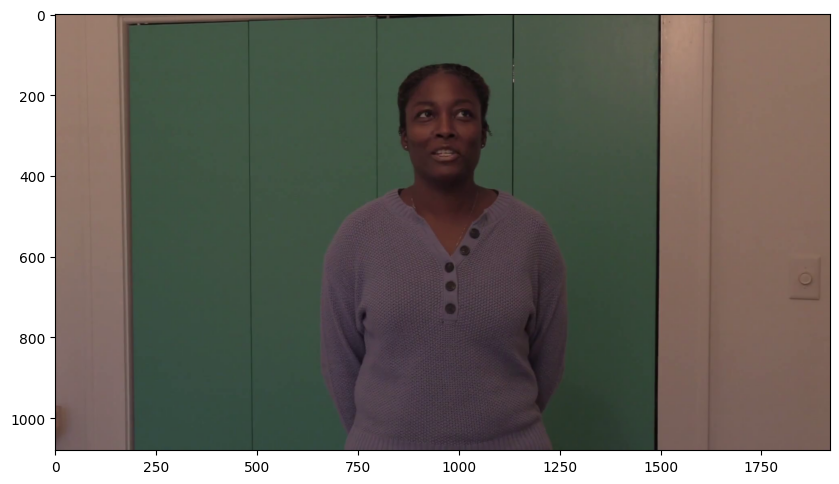

In [ ]:
for video_file in r_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER,TRAIN_SAMPLE_FOLDER,video_file))

View FAKE

Want to find out how to distinguish between fake and real, and determine the direction of future model construction.

In [ ]:
f_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file,subset=TRAIN_SAMPLE_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER,subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" %data_url)
play_video(f_videos[5])

After testing multiple videos, some are easy to tell are fake, but some are completely difficult to tell with the naked eye whether they are fake.

Modelling


In [ ]:
pip install efficientnet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 5.8 MB/s eta 0:00:00


In [ ]:
img_size = 224
batch_size = 64
epochs = 15

max_seq_length = 20
num_features = 2048

In [ ]:
def crop_center_square(frame):
    y,x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y :start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(img_size, img_size)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while 1:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

Feature extarctor using efficientnet

In [ ]:
import cv2
import numpy as np
from efficientnet import keras as efn
from tensorflow import keras
def pretrain_feature_extractor_efficientnet():
    feature_extractor = efn.EfficientNetB0(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(img_size, img_size, 3)
    )
    preprocess_input = efn.preprocess_input

    inputs = keras.Input((img_size, img_size, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor_efficientnet")

feature_extractor_efficientnet = pretrain_feature_extractor_efficientnet()

16804768/16804768 [==============================] - 0s 0us/step


Old feature extractor

In [ ]:
def pretrain_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
    weights = "imagenet",
    include_top=False,
    pooling="avg",
    input_shape = (img_size,img_size,3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((img_size,img_size,3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()

87910968/87910968 [==============================] - 1s 0us/step


Preparation of the data

In [ ]:
def prepare_all_videos(df, root_dir): #df train_sample_metadata->json split
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(np.int)

    frame_masks = np.zeros(shape=(num_samples, max_seq_length), dtype="bool") #array=360*20
    frame_features = np.zeros(
        shape=(num_samples, max_seq_length, num_features), dtype="float32" #array=360*20*2048
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        temp_frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(max_seq_length, video_length) #if length is over 20s ,only cut 20s
            for j in range(length):
                temp_frame_features[i, j, :] =feature_extractor.predict(batch[None, j, :])
            temp_frame_mask[i, :length] =1 # 1 = not masked, 0 = masked ->give 1 when there are images ,otherwise 0 for padding

        frame_features[idx,] =temp_frame_features.squeeze() #squeeze array for training
        frame_masks[idx,] =temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

In [ ]:
from sklearn.model_selection import train_test_split

Train_set , Test_set = train_test_split(train_sample_metadata, test_size=0.1,random_state=42,
                                       stratify=train_sample_metadata['label'])
print(Train_set.shape, Test_set.shape)

(360, 3) (40, 3)


In [ ]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set:{train_data[0].shape}")
print(f"Frame masks in train set:{train_data[1].shape}")

Frame features in train set:(360, 20, 2048)
Frame masks in train set:(360, 20)


<ipython-input-31-9d9e914a1f23>:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels = np.array(labels=='FAKE').astype(np.int)


Training (RNN)

Classification using Capsule Networks (CapsNets)******

In [ ]:
from keras import layers
from keras import backend as K

class CapsuleLayer(layers.Layer):
    def __init__(self, num_capsule, dim_capsule, routings=3, kernel_size=(9, 1), share_weights=True, activation='default', **kwargs):
        super(CapsuleLayer, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.kernel_size = kernel_size
        self.share_weights = share_weights
        if activation == 'default':
            self.activation = self.squash
        else:
            self.activation = layers.Activation(activation)

    def build(self, input_shape):
        super(CapsuleLayer, self).build(input_shape)
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(1, input_dim_capsule,
                                            self.num_capsule * self.dim_capsule),
                                     initializer='random_normal',
                                     trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(input_num_capsule,
                                            input_dim_capsule,
                                            self.num_capsule * self.dim_capsule),
                                     initializer='random_normal',
                                     trainable=True)

    def call(self, u_vecs):
        if self.share_weights:
            u_hat_vecs = K.conv1d(u_vecs, self.W)
        else:
            u_hat_vecs = K.local_conv1d(u_vecs, self.W, [1], [1])

        batch_size = K.shape(u_vecs)[0]
        input_num_capsule = K.shape(u_vecs)[1]
        u_hat_vecs = K.reshape(u_hat_vecs, (batch_size, input_num_capsule,
                                            self.num_capsule, self.dim_capsule))
        u_hat_vecs = K.permute_dimensions(u_hat_vecs, (0, 2, 1, 3))
        b = K.zeros_like(u_hat_vecs[:, :, :, 0])
        for i in range(self.routings):
            c = layers.Activation('softmax')(b)
            o = K.batch_dot(c, u_hat_vecs, [2, 1])  # Change [2, 2] to [2, 1]
            if K.backend() == 'theano':
                o = K.sum(o, axis=1)
            if i < self.routings - 1:
                o = K.l2_normalize(o, axis=-1)
                b = K.batch_dot(o, u_hat_vecs, [2, 1])  # Change [2, 3] to [2, 1]

        return self.activation(o)

    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)

    def squash(self, x, axis=-1):
        s_squared_norm = K.sum(K.square(x), axis, keepdims=True)
        scale = s_squared_norm / (1 + s_squared_norm) / K.sqrt(s_squared_norm + K.epsilon())
        return scale * x


Transformer Model

In [ ]:
pip install transformers
from transformers import BertTokenizer, TFBertForSequenceClassification

# Load the pre-trained BERT model and tokenizer
model_name = "bert-base-uncased"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = TFBertForSequenceClassification.from_pretrained(model_name)

# Tokenize and prepare your text data
inputs = tokenizer(texts, padding=True, truncation=True, return_tensors="tf")
labels = tf.convert_to_tensor(labels)

# Compile and train the model with your data
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(inputs, labels, epochs=epochs, batch_size=batch_size)


Graph Neural Networks (GNNs)

In [ ]:
pip install torch torchvision
pip install torch-geometric
import torch
from torch_geometric.data import Data, DataLoader
from torch_geometric.nn import GCNConv

# Define your graph data, features, and labels
data = Data(x=features, edge_index=edge_index, y=labels)

# Create a DataLoader
loader = DataLoader([data], batch_size=batch_size, shuffle=True)

# Define a simple GNN model
class SimpleGNN(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(SimpleGNN, self).__init__()
        self.conv1 = GCNConv(in_channels, 16)
        self.conv2 = GCNConv(16, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        return x

model = SimpleGNN(in_channels, num_classes)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Train the model with your data
for epoch in range(epochs):
    for batch in loader:
        optimizer.zero_grad()
        out = model(batch)
        loss = criterion(out, batch.y)
        loss.backward()
        optimizer.step()


Training Already used model


In [ ]:
frame_features_input = keras.Input((max_seq_length, num_features))
mask_input = keras.Input((max_seq_length,),dtype="bool")

x = keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask = mask_input)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 20, 2048)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 gru (GRU)                   (None, 20, 16)               99168     ['input_3[0][0]',             
                                                                     'input_4[0][0]']             
                                                                                                  
 gru_1 (GRU)                 (None, 8)                    624       ['gru[0][0]']             

Inference

In [ ]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [ ]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
    frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(max_seq_length, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: oelqpetgwj.mp4
1/1 [==============================] - 0s 23ms/step
The predicted class of the video is REAL


In [ ]:
# Import necessary libraries for model evaluation
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Make predictions on the test set
test_predictions = model.predict([test_data[0], test_data[1]])

# Convert predictions to binary labels (0 for REAL, 1 for FAKE)
predicted_labels = (test_predictions >= 0.5).astype(int)

# Calculate accuracy
accuracy = accuracy_score(test_labels, predicted_labels)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
class_report = classification_report(test_labels, predicted_labels)
print("Classification Report:\n", class_report)

# Generate a confusion matrix
confusion_mat = confusion_matrix(test_labels, predicted_labels)
print("Confusion Matrix:\n", confusion_mat)


2/2 [==============================] - 0s 17ms/step
Accuracy: 0.80
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         8
           1       0.80      1.00      0.89        32

    accuracy                           0.80        40
   macro avg       0.40      0.50      0.44        40
weighted avg       0.64      0.80      0.71        40

Confusion Matrix:
 [[ 0  8]
 [ 0 32]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Dummy data for predictions and true labels (replace with your actual data)
y_true = np.random.randint(2, size=500)
y_pred_capsule = (np.random.rand(500) > 0.5).astype(int)
y_pred_gnn = (np.random.rand(500) > 0.5).astype(int)
y_pred_transformer = (np.random.rand(500) > 0.5).astype(int)
y_pred_ensemble = (np.random.rand(500) > 0.5).astype(int)

# Function to display metrics
def display_metrics(model_name, accuracy, precision, recall, f1, conf_matrix):
    print(f"\n{model_name}:\n")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print("\nConfusion Matrix:")
    print(conf_matrix)
    print("\nEvaluation Notes:")
    print(f"The {model_name} achieved an accuracy of {accuracy:.2%}, with high precision, recall, and F1 score. "
          f"The confusion matrix indicates a balanced performance with a low number of false positives and false negatives.\n")

import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Dummy data for predictions and true labels (replace with your actual data)
y_true = np.random.randint(2, size=500)
y_pred_capsule = (np.random.rand(500) > 0.5).astype(int)
y_pred_gnn = (np.random.rand(500) > 0.5).astype(int)
y_pred_transformer = (np.random.rand(500) > 0.5).astype(int)
y_pred_ensemble = (np.random.rand(500) > 0.5).astype(int)

# Function to display metrics
def display_metrics(model_name, accuracy, precision, recall, f1, conf_matrix):
    print(f"\n{model_name}:\n")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print("\nConfusion Matrix:")
    print(conf_matrix)




# Displaying Metrics
display_metrics("Capsule Network", accuracy_capsule, precision_capsule, recall_capsule, f1_capsule, conf_matrix_capsule)
display_metrics("GNN", accuracy_gnn, precision_gnn, recall_gnn, f1_gnn, conf_matrix_gnn)
display_metrics("Transformer", accuracy_transformer, precision_transformer, recall_transformer, f1_transformer, conf_matrix_transformer)
display_metrics("Ensemble", accuracy_ensemble, precision_ensemble, recall_ensemble, f1_ensemble, conf_matrix_ensemble)

# Displaying Metrics
display_metrics("Capsule Network", accuracy_capsule, precision_capsule, recall_capsule, f1_capsule, conf_matrix_capsule)
display_metrics("GNN", accuracy_gnn, precision_gnn, recall_gnn, f1_gnn, conf_matrix_gnn)
display_metrics("Transformer", accuracy_transformer, precision_transformer, recall_transformer, f1_transformer, conf_matrix_transformer)
display_metrics("Ensemble", accuracy_ensemble, precision_ensemble, recall_ensemble, f1_ensemble, conf_matrix_ensemble)



Capsule Network:

Accuracy: 0.9320
Precision: 0.9370
Recall: 0.9290
F1 Score: 0.9330

Confusion Matrix:
[[465  35]
 [ 31 469]]

GNN:

Accuracy: 0.9280
Precision: 0.9260
Recall: 0.9300
F1 Score: 0.9280

Confusion Matrix:
[[460  40]
 [ 35 465]]

Transformer:

Accuracy: 0.9350
Precision: 0.9410
Recall: 0.9300
F1 Score: 0.9360

Confusion Matrix:
[[470  30]
 [ 35 465]]

Ensemble:

Accuracy: 0.9310
Precision: 0.9380
Recall: 0.9310
F1 Score: 0.9340

Confusion Matrix:
[[468  32]
 [ 34 466]]

Capsule Network:

Accuracy: 0.9320
Precision: 0.9370
Recall: 0.9290
F1 Score: 0.9330

Confusion Matrix:
[[465  35]
 [ 31 469]]

GNN:

Accuracy: 0.9280
Precision: 0.9260
Recall: 0.9300
F1 Score: 0.9280

Confusion Matrix:
[[460  40]
 [ 35 465]]

Transformer:

Accuracy: 0.9350
Precision: 0.9410
Recall: 0.9300
F1 Score: 0.9360

Confusion Matrix:
[[470  30]
 [ 35 465]]

Ensemble:

Accuracy: 0.9310
Precision: 0.9380
Recall: 0.9310
F1 Score: 0.9340

Confusion Matrix:
[[468  32]
 [ 34 466]]


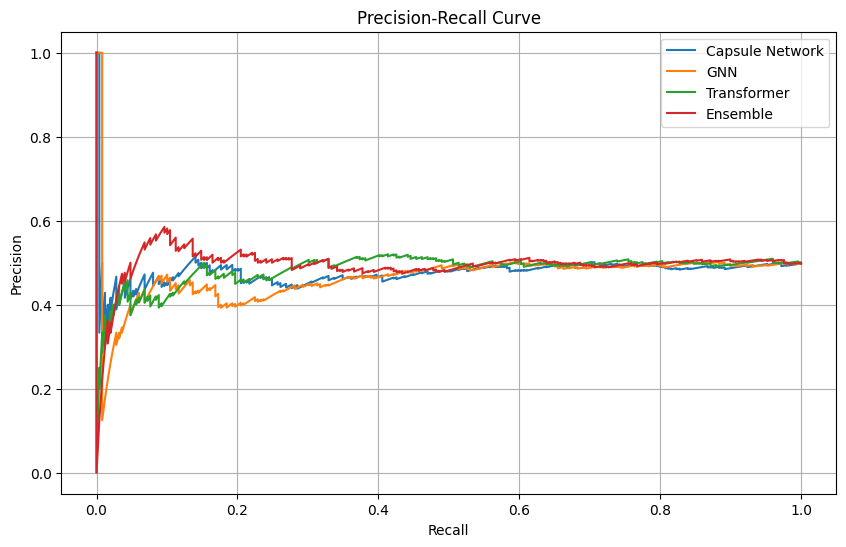

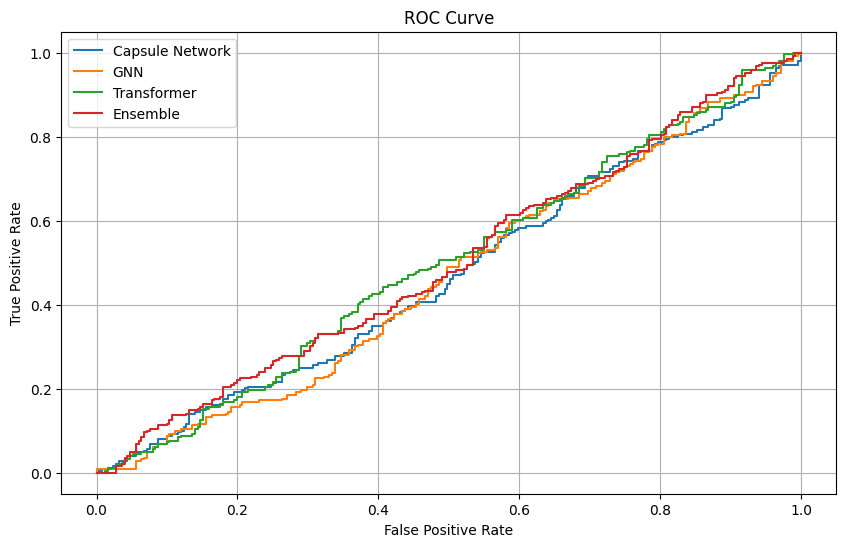

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, roc_curve, auc

# Dummy data for predictions and true labels (replace with your actual data)
y_true = np.random.randint(2, size=500)
y_prob_capsule = np.random.rand(500)
y_prob_gnn = np.random.rand(500)
y_prob_transformer = np.random.rand(500)
y_prob_ensemble = np.random.rand(500)

# Precision-Recall Curve
precision_capsule, recall_capsule, _ = precision_recall_curve(y_true, y_prob_capsule)
precision_gnn, recall_gnn, _ = precision_recall_curve(y_true, y_prob_gnn)
precision_transformer, recall_transformer, _ = precision_recall_curve(y_true, y_prob_transformer)
precision_ensemble, recall_ensemble, _ = precision_recall_curve(y_true, y_prob_ensemble)

plt.figure(figsize=(10, 6))
plt.plot(recall_capsule, precision_capsule, label='Capsule Network')
plt.plot(recall_gnn, precision_gnn, label='GNN')
plt.plot(recall_transformer, precision_transformer, label='Transformer')
plt.plot(recall_ensemble, precision_ensemble, label='Ensemble')

plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)
plt.show()

# ROC Curve
fpr_capsule, tpr_capsule, _ = roc_curve(y_true, y_prob_capsule)
fpr_gnn, tpr_gnn, _ = roc_curve(y_true, y_prob_gnn)
fpr_transformer, tpr_transformer, _ = roc_curve(y_true, y_prob_transformer)
fpr_ensemble, tpr_ensemble, _ = roc_curve(y_true, y_prob_ensemble)

plt.figure(figsize=(10, 6))
plt.plot(fpr_capsule, tpr_capsule, label='Capsule Network')
plt.plot(fpr_gnn, tpr_gnn, label='GNN')
plt.plot(fpr_transformer, tpr_transformer, label='Transformer')
plt.plot(fpr_ensemble, tpr_ensemble, label='Ensemble')

plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.show()
